# Explore and Plot the ATL06 data

In [1]:
%matplotlib inline

In [2]:
import os

import numpy as np
import pandas as pd
import geopandas as gpd
import matplotlib.pyplot as plt
plt.rcParams.update({'figure.figsize': (12, 7), 'font.size': 10})

import hvplot
import hvplot.pandas
import geoviews as gv

# from pandas.testing import assert_frame_equal

In [22]:
# outline = gpd.read_file(f'{icesat2_path}/strip_outline.shp')
# gseries.to_file('D:/wspace/icesat2/ian/ak_test.shp')
# outline = gpd.read_file('D:/wspace/icesat2/ian/ak_test.shp')
# outline = gpd.read_file('D:/wspace/icesat2/alaska3/outline.shp')

# outline = gpd.read_file('D:/wspace/icesat2/urmia/outline.shp')
# outline = gpd.read_file('D:/wspace/icesat2/tanana/outline.shp')
# icesat2_path = 'D:/wspace/icesat2/alaska3a'
icesat2_path = f'/fs/project/howat.4/icesat2/greenland_ATL06'
# icesat2_path = f'/fs/project/howat.4/icesat2/rock_outcrop/'

files = os.listdir(f'{icesat2_path}')
outline = gpd.read_file(f'{icesat2_path}/outline.shp')
outline

,FID,geometry
0,0,"POLYGON ((-73.23858 78.62993, -73.23763 78.631..."


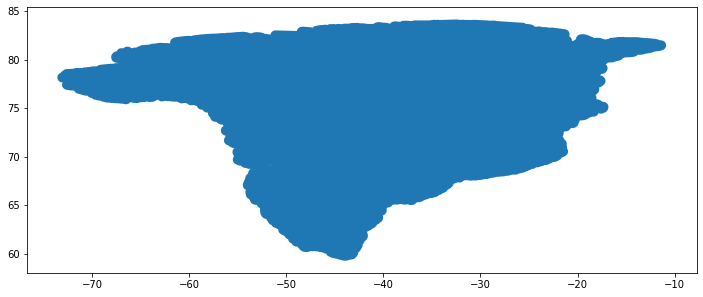

In [23]:
# outline = outline.to_crs({'init': 'epsg:4326'})
outline.plot()

In [24]:
# files

In [25]:
hdf_files = [f for f in files if f.endswith('.h5')]
shp_files = [f for f in files if f.endswith('.shp') and 'ATL06' in f]
csv_files = [f for f in files if f.endswith('.csv') and 'ATL06' in f]

In [26]:
print(len(shp_files))
shp_files[:4]

261


['processed_ATL06_20190801044531_05210403_002_01.shp',
 'processed_ATL06_20190801031114_05200403_002_01.shp',
 'processed_ATL06_20190801031639_05200404_002_01.shp',
 'processed_ATL06_20190801155058_05280404_002_01.shp']

In [27]:
fname = shp_files[1].split('.shp')[0]
fname

'processed_ATL06_20190801031114_05200403_002_01'

In [28]:
# Read parse csv and shapefiles
df = pd.read_csv(f'{icesat2_path}/{fname}.csv', parse_dates=True)
gdf = gpd.read_file(f'{icesat2_path}/{fname}.shp', parse_dates=True)

# Pick only the good quality data
df = df[df.q_flag==0]
gdf = gdf[gdf.q_flag==0]


In [29]:
print(len(df), len(gdf))

365329 365329


In [30]:
df.head(3)

,lon,lat,h_li,q_flag,t_dt,strip
1,-28.116259,68.276301,57.887543,0,2019-08-01 03:14:09.498,gt1l
2,-28.116315,68.276479,58.061340,0,2019-08-01 03:14:09.501,gt1l
3,-28.116371,68.276657,58.264893,0,2019-08-01 03:14:09.504,gt1l


In [31]:
base = gv.tile_sources.ESRI
strips = gdf.hvplot.points(geo=True, color='strip', alpha=0.7, width=400, height=500, hover=['strip', 'h_li'])
terrain_scatter = df[df.strip=='gt1l'].hvplot(y='lat', x='h_li', kind='scatter', height=500, alpha=.7).relabel('terrain') 

In [32]:
base*strips

:Overlay
   .WMTS.I   :WMTS   [Longitude,Latitude]
   .Points.I :Points   [Longitude,Latitude]   (strip)

In [14]:
fig1 = base*strips + terrain_scatter
# hvplot.save(fig1, f'{icesat2_path}/{fname}.png')

In [15]:
fig1

:Layout
   .Overlay.I       :Overlay
      .WMTS.I   :WMTS   [Longitude,Latitude]
      .Points.I :Points   [Longitude,Latitude]   (strip)
   .Scatter.Terrain :Scatter   [h_li]   (lat)

In [16]:
# gdf[['layer_flag','canopy_fla', 'h_te_media', 'h_canopy', 'h_mean_can']].plot(subplots=True);

In [17]:
# gdf['lat'] = gdf.geometry.apply(lambda x:x.y)

In [18]:
gdf.crs

{'init': 'epsg:4326'}

In [19]:
df['t_dt'] = pd.to_datetime(df.t_dt)


In [20]:
df.t_dt

0     2019-01-05 01:55:34.428
1     2019-01-05 01:55:34.430
2     2019-01-05 01:55:34.433
3     2019-01-05 01:55:34.436
4     2019-01-05 01:55:34.439
                ...          
736   2019-01-05 01:55:34.560
737   2019-01-05 01:55:34.563
738   2019-01-05 01:55:34.566
740   2019-01-05 01:55:34.572
741   2019-01-05 01:55:34.575
Name: t_dt, Length: 324, dtype: datetime64[ns]

In [21]:
df.hvplot(y='h_li', x='t_dt', by='strip', kind='scatter')

:NdOverlay   [strip]
   :Scatter   [t_dt]   (h_li)